In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
June_2015= pd.read_csv('data/june_2015_with_roundtrip.csv')
July_2015= pd.read_csv('data/july_2015_with_roundtrip.csv')
Aug_2015= pd.read_csv('data/august_2015_with_roundtrip.csv')
June_2016=pd.read_csv('data/june_2016_with_roundtrip.csv')
July_2016=pd.read_csv('data/july_2016_with_roundtrip.csv')
Aug_2016=pd.read_csv('data/august_2016_with_roundtrip.csv')

Add a column for week day (from Monday to Sunday)

In [5]:
import time
import datetime
import calendar
def add_weekend(data):#for months except June 2015   
    weekend=[]
    f = "%m/%d/%Y %H:%M:%S"
    for i in range(len(data)):
        weekend.append(calendar.day_name[datetime.datetime.strptime(data["starttime"].values[i],f).weekday()])
    return weekend

def add_weekend1(data):#for year June 2015
    weekend=[]
    f = "%m/%d/%Y %H:%M"
    for i in range(len(data)):
        weekend.append(calendar.day_name[datetime.datetime.strptime(data["starttime"].values[i],f).weekday()])
    return weekend

In [6]:
June_2015["day of week"]=add_weekend1(June_2015)
July_2015["day of week"]=add_weekend(July_2015)
Aug_2015["day of week"]=add_weekend(Aug_2015)
June_2016["day of week"]=add_weekend(June_2016)
July_2016["day of week"]=add_weekend(July_2016)
Aug_2016["day of week"]=add_weekend(Aug_2016)

Extract the data of weekends

In [10]:
#get the data in weekends
def get_weekend(data):
    #get rid of 'Unnamed: 0' row
    del data['Unnamed: 0']
    data=data[data["day of week"].isin(["Saturday","Sunday"])]
    return data

In [11]:
June_2015_weekend=get_weekend(June_2015)
July_2015_weekend=get_weekend(July_2015)
Aug_2015_weekend=get_weekend(Aug_2015)
June_2016_weekend=get_weekend(June_2016)
July_2016_weekend=get_weekend(July_2016)
Aug_2016_weekend=get_weekend(Aug_2016)

Add another column for how many minutes passed since 00:00 of the day (based on the starttime)

In [15]:
#get minutes in the day
def get_time(data): # for June 2015
    f = "%m/%d/%Y %H:%M"
    time=[]
    for i in range(len(data)):
        date=datetime.datetime.strptime(data["starttime"].values[i],f)
        time.append(date.hour*60+date.minute)
    return time

def get_time1(data):# for the rest months
    f = "%m/%d/%Y %H:%M:%S"
    time=[]
    for i in range(len(data)):
        date=datetime.datetime.strptime(data["starttime"].values[i],f)
        time.append(date.hour*60+date.minute)
    return time

In [23]:
June_2015_weekend["minutes since 00:00"]=get_time(June_2015_weekend)
July_2015_weekend["minutes since 00:00"]=get_time1(July_2015_weekend)
Aug_2015_weekend["minutes since 00:00"]=get_time1(Aug_2015_weekend)
June_2016_weekend["minutes since 00:00"]=get_time1(June_2016_weekend)
July_2016_weekend["minutes since 00:00"]=get_time1(July_2016_weekend)
Aug_2016_weekend["minutes since 00:00"]=get_time1(Aug_2016_weekend)

C:\Users\JinChen\Anaconda3\lib\site-packages\ipykernel\__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
C:\Users\JinChen\Anaconda3\lib\site-packages\ipykernel\__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app
C:\Users\JinChen\Anaconda3\lib\site-packages\ipykernel\__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docume

In [136]:
June_2015_weekend.head()

,tripduration,starttime,stoptime,start station id,start station name,start station latitude,start station longitude,end station id,end station name,end station latitude,end station longitude,bikeid,usertype,birth year,gender,roundtrip,day of week,minutes since 00:00
115567,725,6/6/2015 0:00,6/6/2015 0:12,472,E 32 St & Park Ave,40.745712,-73.981948,455,1 Ave & E 44 St,40.750020,-73.969053,17738,Subscriber,1982.0,2,0,Saturday,0
115568,1024,6/6/2015 0:00,6/6/2015 0:17,525,W 34 St & 11 Ave,40.755942,-74.002116,228,E 48 St & 3 Ave,40.754601,-73.971879,19395,Subscriber,1988.0,1,0,Saturday,0
115569,273,6/6/2015 0:00,6/6/2015 0:05,426,West St & Chambers St,40.717548,-74.013221,328,Watts St & Greenwich St,40.724055,-74.009660,14550,Subscriber,1978.0,1,0,Saturday,0
115570,1301,6/6/2015 0:01,6/6/2015 0:22,464,E 56 St & 3 Ave,40.759345,-73.967597,410,Suffolk St & Stanton St,40.720664,-73.985180,21312,Subscriber,1987.0,1,0,Saturday,1
115571,1044,6/6/2015 0:01,6/6/2015 0:18,536,1 Ave & E 30 St,40.741444,-73.975361,445,E 10 St & Avenue A,40.727408,-73.981420,18576,Subscriber,1989.0,1,0,Saturday,1


Combine the 6 datasets to form 2 datasets: summer 2015 and summer 2016

In [62]:
summer2015 = pd.DataFrame()
summer2016 = pd.DataFrame()
all_2015 = []
all_2016 = []

all_2015.append(June_2015_weekend)
all_2015.append(July_2015_weekend)
all_2015.append(Aug_2015_weekend)
all_2016.append(June_2016_weekend)
all_2016.append(July_2016_weekend)
all_2016.append(Aug_2016_weekend)

summer2015 = pd.concat(all_2015)
summer2016 = pd.concat(all_2016)

In [63]:
summer2015=summer2015.reset_index()
summer2016=summer2016.reset_index()
del summer2015["index"]
del summer2016["index"]

In [137]:
len(summer2015),len(June_2015_weekend),len(July_2015_weekend), len(Aug_2015_weekend)

(534573, 148652, 156930, 228991)

In [138]:
len(summer2016),len(June_2016_weekend),len(July_2016_weekend), len(Aug_2016_weekend)

(744244, 248086, 267167, 228991)

In [64]:
summer2015.head()

,tripduration,starttime,stoptime,start station id,start station name,start station latitude,start station longitude,end station id,end station name,end station latitude,end station longitude,bikeid,usertype,birth year,gender,roundtrip,day of week,minutes since 00:00
0,725,6/6/2015 0:00,6/6/2015 0:12,472,E 32 St & Park Ave,40.745712,-73.981948,455,1 Ave & E 44 St,40.750020,-73.969053,17738,Subscriber,1982.0,2,0,Saturday,0
1,1024,6/6/2015 0:00,6/6/2015 0:17,525,W 34 St & 11 Ave,40.755942,-74.002116,228,E 48 St & 3 Ave,40.754601,-73.971879,19395,Subscriber,1988.0,1,0,Saturday,0
2,273,6/6/2015 0:00,6/6/2015 0:05,426,West St & Chambers St,40.717548,-74.013221,328,Watts St & Greenwich St,40.724055,-74.009660,14550,Subscriber,1978.0,1,0,Saturday,0
3,1301,6/6/2015 0:01,6/6/2015 0:22,464,E 56 St & 3 Ave,40.759345,-73.967597,410,Suffolk St & Stanton St,40.720664,-73.985180,21312,Subscriber,1987.0,1,0,Saturday,1
4,1044,6/6/2015 0:01,6/6/2015 0:18,536,1 Ave & E 30 St,40.741444,-73.975361,445,E 10 St & Avenue A,40.727408,-73.981420,18576,Subscriber,1989.0,1,0,Saturday,1


get all station names for year 2015

In [88]:
def get_name(data):
    start_name=[]
    start_name=data["start station name"]
    start_name=set(start_name)
    start_name=list(start_name)
    return start_name

In [135]:
all_stations_2015=get_name(summer2015)
all_stations_2016=get_name(summer2016)

In [139]:
len(all_stations_2015),len(all_stations_2016)

(421, 500)

The number of stations in 2015 is different from the number of stations in 2016.

Form a new dataframe for each station. 
So, for each station, we have only two columns --- "minutes since 00:00" and "roundtrip". 
We use these two columns to find a way to predict whether a trip is roundtrip or not, given a station name and time.

In [96]:
def get_dataframes(data, station):
    df=data[data["start station name"]==station]
    time=df["minutes since 00:00"].values
    roundtrip=df["roundtrip"].values
    new_data=pd.DataFrame()
    new_data["minutes since 00:00"]=time
    new_data["roundtrip"]=roundtrip
    return new_data

An array for the data frames for 2015.

In [99]:
data_2015=[]
for name in all_stations_2015:
    data=get_dataframes(summer2015,name)
    data_2015.append(data)

Do the same thing for 2016.

In [140]:
data_2016=[]
for name in all_stations_2016:
    data=get_dataframes(summer2016,name)
    data_2016.append(data)

Now,draw scatter plot for each station.

In [133]:
def draw_scatter(data,name):
    x=data["minutes since 00:00"].values
    y=data["roundtrip"].values
    plt.scatter(x,y)
    plt.xlabel("minutes since 00:00")
    plt.ylabel("roundtrip (1==Yes / 0==No) ")
    plt.title("Scatter plot on "+name)
    graph=plt.show()

Here are the plots for year 2015.

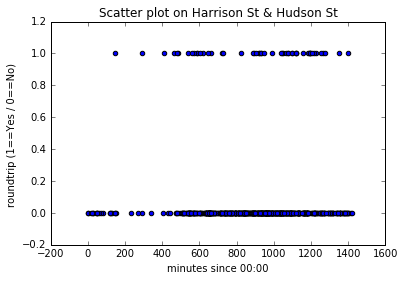

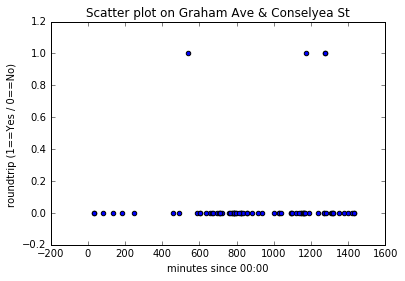

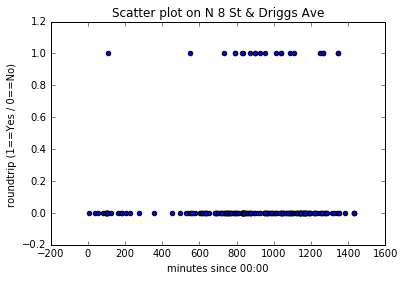

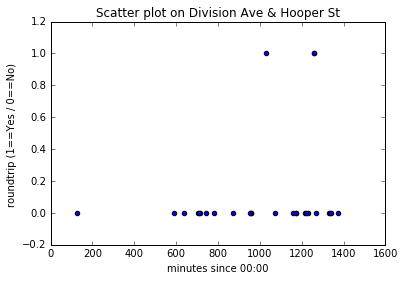

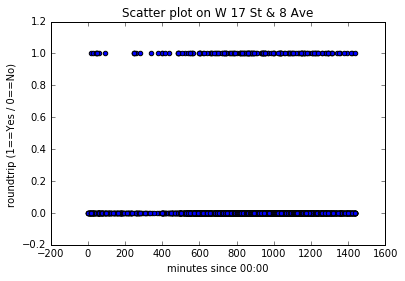

...

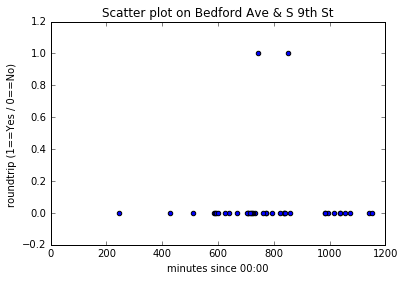

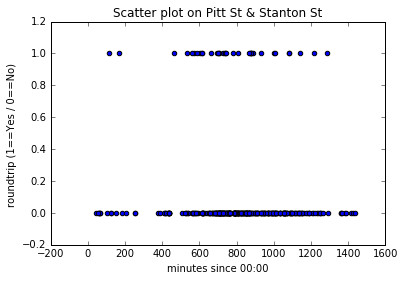

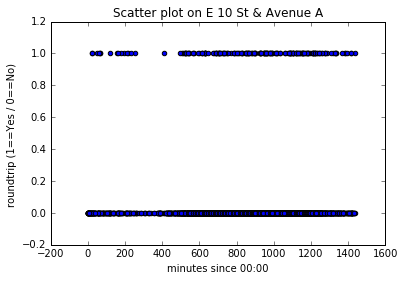

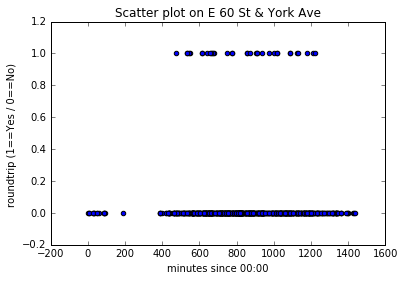

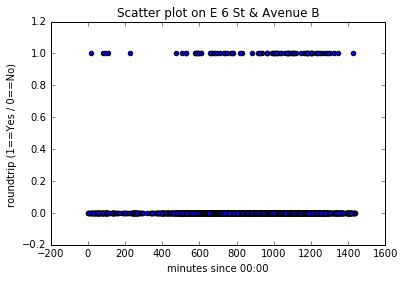

In [134]:
for i in range(len(data_2015)):
    draw_scatter(data_2015[i],all_stations_2015[i])

Here are the plots for year 2016.

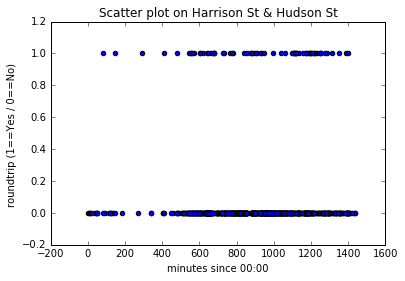

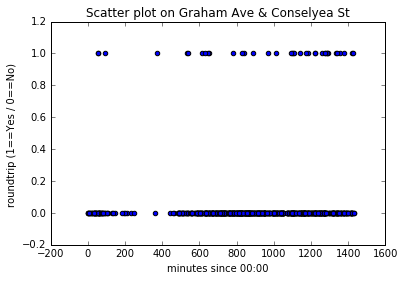

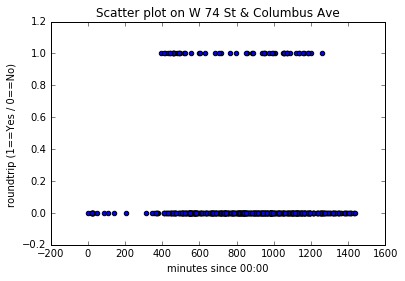

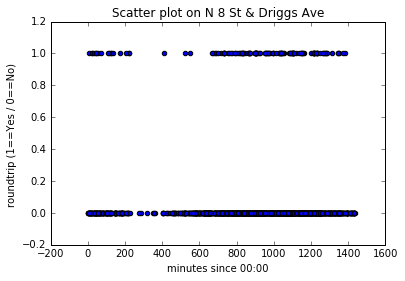

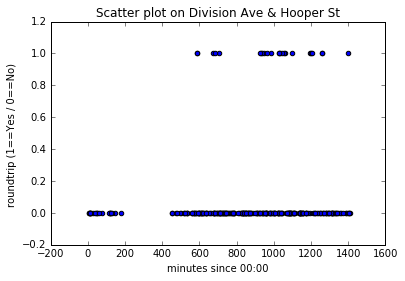

...

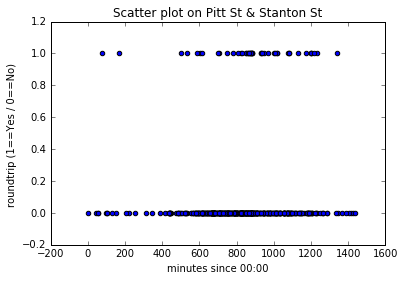

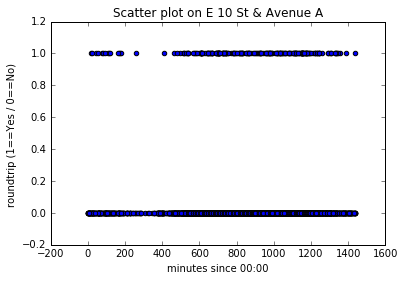

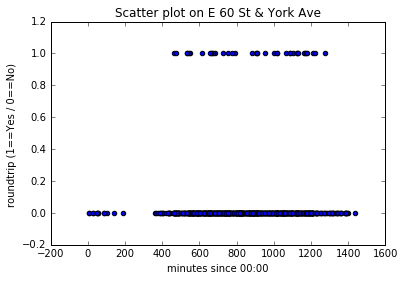

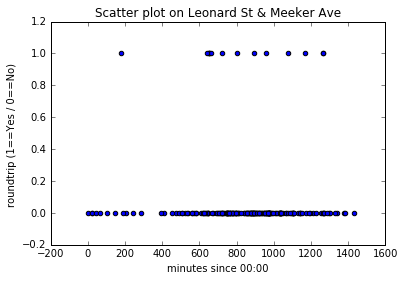

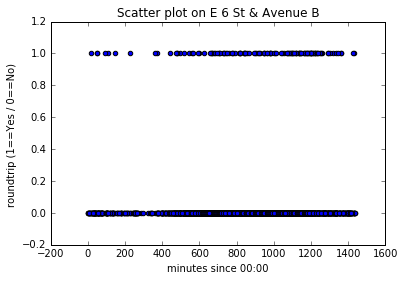

In [143]:
for i in range(len(data_2016)):
    draw_scatter(data_2016[i],all_stations_2016[i])

# I am planning to use KNN on the data. But I don't know how to do it.

# Please Ignore those codes below

In [22]:
"""
#get data of roundtrip
roundtrip=roundtrip[roundtrip["start station name"]==roundtrip["end station name"]]
#get data of one way trip
one_way=one_way[one_way["start station name"]!=one_way["end station name"]]
len(roundtrip),len(one_way)"""

'\n#get data of roundtrip\nroundtrip=roundtrip[roundtrip["start station name"]==roundtrip["end station name"]]\n#get data of one way trip\none_way=one_way[one_way["start station name"]!=one_way["end station name"]]\nlen(roundtrip),len(one_way)'

In [8]:
"""tripduration1=roundtrip["tripduration"].values
plt.hist(tripduration1, 20, range=[0, 8000], facecolor='green')
plt.title("Timeduration in weekends in June 2016")
plt.xlabel("Time(seconds)")
plt.ylabel("Number of riders")"""

'tripduration1=roundtrip["tripduration"].values\nplt.hist(tripduration1, 20, range=[0, 8000], facecolor=\'green\')\nplt.title("Timeduration in weekends in June 2016")\nplt.xlabel("Time(seconds)")\nplt.ylabel("Number of riders")'

In [9]:
"""
count1=0
count2=0
count3=0
count4=0
count5=0
for i in tripduration1:
    if(i<=600):#10 minutes
        count1=count1+1
    elif(i>600 and i<=1800):#30 minutes
        count2=count2+1
    elif(i>1800 and i<=3600):# 1 hour
        count3=count3+1
    elif(i>3600 and i<=7200):# 2 hours
        count4=count4+1
    else:
        count5=count5+1
count=[count1,count2,count3,count4,count5]
t=["<10 minutes","10-30 minutes","30-60 minutes","60-120 minutes",">120 minutes"]
plt.bar(range(5),count,tick_label=t)
plt.xticks(rotation=45)
plt.title("Timeduration in weekends in June 2016")
plt.xlabel("Time")
plt.ylabel("Number of riders")
"""

'\ncount1=0\ncount2=0\ncount3=0\ncount4=0\ncount5=0\nfor i in tripduration1:\n    if(i<=600):#10 minutes\n        count1=count1+1\n    elif(i>600 and i<=1800):#30 minutes\n        count2=count2+1\n    elif(i>1800 and i<=3600):# 1 hour\n        count3=count3+1\n    elif(i>3600 and i<=7200):# 2 hours\n        count4=count4+1\n    else:\n        count5=count5+1\ncount=[count1,count2,count3,count4,count5]\nt=["<10 minutes","10-30 minutes","30-60 minutes","60-120 minutes",">120 minutes"]\nplt.bar(range(5),count,tick_label=t)\nplt.xticks(rotation=45)\nplt.title("Timeduration in weekends in June 2016")\nplt.xlabel("Time")\nplt.ylabel("Number of riders")\n'

In [24]:
"""
#get all station names
def get_name(data):
    start_name=[]
    start_name=data["start station name"]
    start_name=set(start_name)
    start_name=list(start_name)
    new_data=pd.DataFrame(start_name)
    new_data.head()
"""

In [12]:
"""
roundtrip_name=roundtrip["start station name"].values
one_way_name=one_way["start station name"].values
round_count=[]
one_way_count=[]
#count number of roundtrip in each station
for name in start_name:
    count=0
    for round_name in roundtrip_name:
        if(name==round_name):
            count=count+1
    round_count.append(count)
#count number of one way trip in each station
for name in start_name:
    count=0
    for one_name in one_way_name:
        if(name==one_name):
            count=count+1
    one_way_count.append(count)"""

In [26]:
"""
#get dataframe that is sorted by round trip number
new_data['count of round trip']=round_count
new_data['count of one way trip']=one_way_count
new_data.columns=['start station name','count of round trip','count of one way trip']
new_data=new_data.sort_values(by='count of round trip', ascending=False)
new_data=new_data.reset_index()
del new_data["index"]
new_data.head()"""

'\n#get dataframe that is sorted by round trip number\nnew_data[\'count of round trip\']=round_count\nnew_data[\'count of one way trip\']=one_way_count\nnew_data.columns=[\'start station name\',\'count of round trip\',\'count of one way trip\']\nnew_data=new_data.sort_values(by=\'count of round trip\', ascending=False)\nnew_data=new_data.reset_index()\ndel new_data["index"]\nnew_data.head()'